In [1]:
import pandas as pd
import pickle
import eli5
import numpy as np
import altair as alt
alt.renderers.enable('notebook')
alt.data_transformers.disable_max_rows()

Using TensorFlow backend.
/home/geoanton/anaconda3/envs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/geoanton/anaconda3/envs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/geoanton/anaconda3/envs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/geoanton/an

DataTransformerRegistry.enable('default')

# Look at the locations of wells:

In [2]:
labs =['Train','Validation','Test']
dfs = {}
dfs_preds = {}
for l in labs:
    df = pd.read_pickle(f'../data/final/{l}_final.pck')
    print(df.shape)
    dfs[l] = df
    
test_wells = pd.read_csv(f'../data/raw/regression_sample_submission_test.txt')['EPAssetsId']
dfs['Test'] = dfs['Test'].loc[ dfs['Test']['EPAssetsId'].isin(test_wells),:] 

df_all_regr = pd.concat(list(dfs.values()),axis = 0,keys=list(dfs.keys()))
df_all_regr['key'] = df_all_regr.index.get_level_values(0)

for l in ['Oil_norm','Gas_norm','Water_norm']:
    pred_df = pd.read_pickle(f'../data/final/preds_{l}_validation.pck')
    print(pred_df.shape)
    dfs_preds[l] = pred_df


(6256, 51)
(1329, 51)
(1406, 47)
(1319, 3)
(1323, 3)
(1029, 3)


/home/geoanton/anaconda3/envs/keras/lib/python3.6/site-packages/ipykernel_launcher.py:12: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  if sys.path[0] == '':


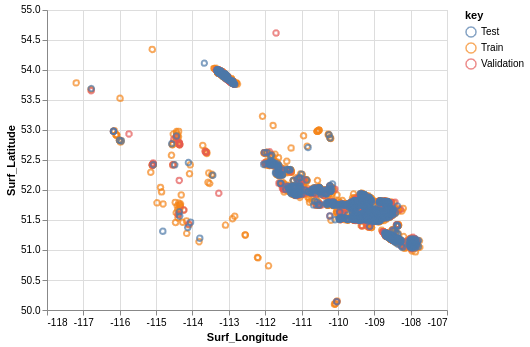

In [3]:
alt.Chart(data=df_all_regr.reset_index()).encode(x=alt.Longitude('Surf_Longitude',scale=alt.Scale(zero=False)),y=alt.Latitude('Surf_Latitude',scale=alt.Scale(zero=False)),color='key').mark_point()

# Look at the error

In [9]:
tgt = 'Water_norm'
err_df = dfs_preds[tgt]
err_df['err'] = err_df[tgt] - err_df['gt'] 
err_df['aerr'] = np.abs(err_df['gt'] -err_df[tgt] )

err_df['sign'] = np.sign(err_df[tgt] - err_df['gt']).astype(int)

err_df.shape

(1029, 6)

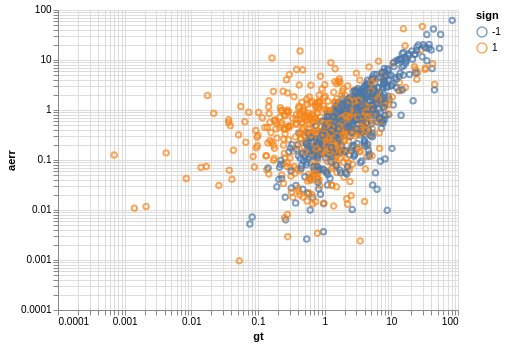

In [10]:
#alt.Chart(err_df).encode(x=alt.X('gt',scale=alt.Scale(type='log')),y=alt.Y('err',scale = alt.Scale(type='log'))).mark_point()
alt.Chart(err_df).encode(x=alt.X('gt',scale=alt.Scale(base=10,type='log')),y=alt.Y('aerr',scale=alt.Scale(base=10,type='log')),color='sign:N',tooltip=['err','gt']).mark_point()

In [12]:
df_all = pd.concat([dfs['Train'],dfs['Validation']],keys=('train','validation'))
df_all = df_all.merge(err_df[['err','EPAssetsId']],on='EPAssetsId')

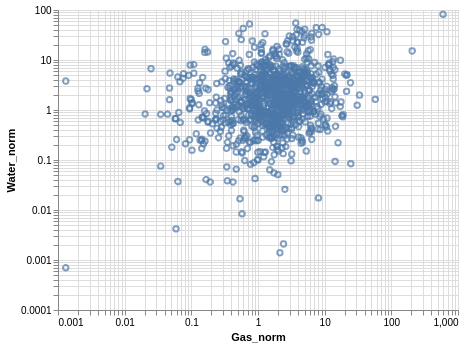

In [33]:
alt.Chart(data=df_all).encode(x=alt.X('Gas_norm',scale=alt.Scale(base=10,type='log')),y=alt.Y('Water_norm',scale=alt.Scale(base=10,type='log'))).mark_point()

In [20]:
df_all_regr.isna().sum()

Agent                         0
CompletionDate             1901
Confidential                  0
ConfidentialReleaseDate    1511
CurrentOperator               0
CurrentOperatorParent         0
DaysDrilling                  0
DrillMetresPerDay             0
DrillingContractor            0
EPAssetsId                    0
Field                         0
FinalDrillDate                0
Formation                     0
Gas_norm                   1442
GroundElevation               0
HZLength                      3
KBElevation                   0
LaheeClass                    0
LengthDrill                   0
LicenceDate                   0
Licensee                      0
Municipality                  0
Oil_norm                   1484
Pool                          0
ProjectedDepth               39
RigReleaseDate                0
SpudDate                      0
StatusDate                    0
StatusSource                  0
SurfAbandonDate            8970
Surf_Latitude                 0
Surf_Lon

(8991, 52)

In [70]:
dfs['Train']['Oil_norm']

0       18.589154
1       10.582239
2        2.856967
3       14.941070
4       22.879497
          ...    
6251     2.234976
6252     3.258116
6253    25.093507
6254     2.086117
6255    20.953420
Name: Oil_norm, Length: 6256, dtype: float64